In [6]:
%pip install nltk spacy pymorphy2 pymorphy2-dicts pymystem3 pandas matplotlib wordcloud
%pip install spacy[ru]


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.stem import SnowballStemmer
from nltk.tokenize import WordPunctTokenizer
from nltk.tokenize import RegexpTokenizer
from pymystem3 import Mystem
import pandas as pd
import matplotlib
import wordcloud
import spacy
from spacy import displacy

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Ustin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Ustin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ustin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Дневник Коли Синицина


In [8]:
with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
wordpunct = nltk.tokenize.WordPunctTokenizer()
print(wordpunct.tokenize(text))

['Николай', 'Носов', 'Дневник', 'Коли', 'Синицына', '28', 'мая', 'У', 'меня', 'сегодня', 'очень', 'радостный', 'день', ':', 'занятия', 'в', 'школе', 'окончились', 'и', 'я', 'перешел', 'в', 'следующий', 'класс', 'с', 'одними', 'пятерками', '.', 'Завтра', 'начинаются', 'каникулы', '.', 'Я', 'задумал', 'во', 'время', 'каникул', 'вести', 'дневник', '.', 'Мама', 'сказала', ',', 'что', 'подарит', 'мне', 'вечную', 'ручку', ',', 'если', 'я', 'буду', 'вести', 'дневник', 'аккуратно', '.', 'Я', 'купил', 'толстую', 'общую', 'тетрадь', 'в', 'синей', 'обложке', 'и', 'решил', 'аккуратно', 'записывать', 'в', 'эту', 'тетрадь', 'разные', 'интересные', 'случаи', '.', 'Как', 'только', 'случится', 'что', '-', 'нибудь', 'интересное', ',', 'я', 'сейчас', 'же', 'запишу', '.', 'Кроме', 'того', ',', 'буду', 'записывать', 'свои', 'мысли', '.', 'Буду', 'думать', 'о', 'разных', 'вещах', 'и', ',', 'как', 'только', 'в', 'голову', 'придет', 'хорошая', 'мысль', ',', 'я', 'тоже', 'ее', 'запишу', '.', 'Сегодня', 'еще', 

In [9]:
with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized

['Николай',
 'Носов',
 'Дневник',
 'Коли',
 'Синицына',
 '28',
 'мая',
 'У',
 'меня',
 'сегодня',
 'очень',
 'радостный',
 'день',
 ':',
 'занятия',
 'в',
 'школе',
 'окончились',
 'и',
 'я',
 'перешел',
 'в',
 'следующий',
 'класс',
 'с',
 'одними',
 'пятерками',
 '.',
 'Завтра',
 'начинаются',
 'каникулы',
 '.',
 'Я',
 'задумал',
 'во',
 'время',
 'каникул',
 'вести',
 'дневник',
 '.',
 'Мама',
 'сказала',
 ',',
 'что',
 'подарит',
 'мне',
 'вечную',
 'ручку',
 ',',
 'если',
 'я',
 'буду',
 'вести',
 'дневник',
 'аккуратно',
 '.',
 'Я',
 'купил',
 'толстую',
 'общую',
 'тетрадь',
 'в',
 'синей',
 'обложке',
 'и',
 'решил',
 'аккуратно',
 'записывать',
 'в',
 'эту',
 'тетрадь',
 'разные',
 'интересные',
 'случаи',
 '.',
 'Как',
 'только',
 'случится',
 'что-нибудь',
 'интересное',
 ',',
 'я',
 'сейчас',
 'же',
 'запишу',
 '.',
 'Кроме',
 'того',
 ',',
 'буду',
 'записывать',
 'свои',
 'мысли',
 '.',
 'Буду',
 'думать',
 'о',
 'разных',
 'вещах',
 'и',
 ',',
 'как',
 'только',
 'в',
 '

In [10]:
tagged = nltk.pos_tag(tokenized)
tagged

[('Николай', 'JJ'),
 ('Носов', 'NNP'),
 ('Дневник', 'NNP'),
 ('Коли', 'NNP'),
 ('Синицына', 'VBD'),
 ('28', 'CD'),
 ('мая', 'NNP'),
 ('У', 'NNP'),
 ('меня', 'NNP'),
 ('сегодня', 'NNP'),
 ('очень', 'NNP'),
 ('радостный', 'NNP'),
 ('день', 'NN'),
 (':', ':'),
 ('занятия', 'JJ'),
 ('в', 'NNP'),
 ('школе', 'NNP'),
 ('окончились', 'NNP'),
 ('и', 'NNP'),
 ('я', 'NNP'),
 ('перешел', 'NNP'),
 ('в', 'NNP'),
 ('следующий', 'NNP'),
 ('класс', 'NNP'),
 ('с', 'NNP'),
 ('одними', 'NNP'),
 ('пятерками', 'NNP'),
 ('.', '.'),
 ('Завтра', 'VB'),
 ('начинаются', 'JJ'),
 ('каникулы', 'NNP'),
 ('.', '.'),
 ('Я', 'VB'),
 ('задумал', 'JJ'),
 ('во', 'NNP'),
 ('время', 'NNP'),
 ('каникул', 'NNP'),
 ('вести', 'NNP'),
 ('дневник', 'NNP'),
 ('.', '.'),
 ('Мама', 'NN'),
 ('сказала', 'NN'),
 (',', ','),
 ('что', 'NNP'),
 ('подарит', 'NNP'),
 ('мне', 'NNP'),
 ('вечную', 'NNP'),
 ('ручку', 'NNP'),
 (',', ','),
 ('если', 'NNP'),
 ('я', 'NNP'),
 ('буду', 'NNP'),
 ('вести', 'NNP'),
 ('дневник', 'NNP'),
 ('аккуратно', 'N

In [11]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Николай',
 'Носов',
 'Дневник',
 'Коли',
 'Синицына',
 '28',
 'мая',
 'У',
 'меня',
 'сегодня',
 'очень',
 'радостный',
 'день',
 ':',
 'занятия',
 'в',
 'школе',
 'окончились',
 'и',
 'я',
 'перешел',
 'в',
 'следующий',
 'класс',
 'с',
 'одними',
 'пятерками',
 '.',
 'Завтра',
 'начинаются',
 'каникулы',
 '.',
 'Я',
 'задумал',
 'во',
 'время',
 'каникул',
 'вести',
 'дневник',
 '.',
 'Мама',
 'сказала',
 ',',
 'что',
 'подарит',
 'мне',
 'вечную',
 'ручку',
 ',',
 'если',
 'я',
 'буду',
 'вести',
 'дневник',
 'аккуратно',
 '.',
 'Я',
 'купил',
 'толстую',
 'общую',
 'тетрадь',
 'в',
 'синей',
 'обложке',
 'и',
 'решил',
 'аккуратно',
 'записывать',
 'в',
 'эту',
 'тетрадь',
 'разные',
 'интересные',
 'случаи',
 '.',
 'Как',
 'только',
 'случится',
 'что-нибудь',
 'интересное',
 ',',
 'я',
 'сейчас',
 'же',
 'запишу',
 '.',
 'Кроме',
 'того',
 ',',
 'буду',
 'записывать',
 'свои',
 'мысли',
 '.',
 'Буду',
 'думать',
 'о',
 'разных',
 'вещах',
 'и',
 ',',
 'как',
 'только',
 'в',
 '

In [12]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('C'):
        return nltk.corpus.wordnet.CD
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Николай', 'JJ'),
 ('Носов', 'NNP'),
 ('Дневник', 'NNP'),
 ('Коли', 'NNP'),
 ('Синицына', 'VBD'),
 ('28', 'CD'),
 ('мая', 'NNP'),
 ('У', 'NNP'),
 ('меня', 'NNP'),
 ('сегодня', 'NNP'),
 ('очень', 'NNP'),
 ('радостный', 'NNP'),
 ('день', 'NN'),
 (':', ':'),
 ('занятия', 'JJ'),
 ('в', 'NNP'),
 ('школе', 'NNP'),
 ('окончились', 'NNP'),
 ('и', 'NNP'),
 ('я', 'NNP'),
 ('перешел', 'NNP'),
 ('в', 'NNP'),
 ('следующий', 'NNP'),
 ('класс', 'NNP'),
 ('с', 'NNP'),
 ('одними', 'NNP'),
 ('пятерками', 'NNP'),
 ('.', '.'),
 ('Завтра', 'VB'),
 ('начинаются', 'JJ'),
 ('каникулы', 'NNP'),
 ('.', '.'),
 ('Я', 'VB'),
 ('задумал', 'JJ'),
 ('во', 'NNP'),
 ('время', 'NNP'),
 ('каникул', 'NNP'),
 ('вести', 'NNP'),
 ('дневник', 'NNP'),
 ('.', '.'),
 ('Мама', 'NN'),
 ('сказала', 'NN'),
 (',', ','),
 ('что', 'NNP'),
 ('подарит', 'NNP'),
 ('мне', 'NNP'),
 ('вечную', 'NNP'),
 ('ручку', 'NNP'),
 (',', ','),
 ('если', 'NNP'),
 ('я', 'NNP'),
 ('буду', 'NNP'),
 ('вести', 'NNP'),
 ('дневник', 'NNP'),
 ('аккуратно', 'N

In [13]:
stemmer = SnowballStemmer(language='russian')
with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
stemmed = [stemmer.stem(word) for word in tokenized]
stemmed

['никола',
 'нос',
 'дневник',
 'кол',
 'синицын',
 '28',
 'ма',
 'у',
 'мен',
 'сегодн',
 'очен',
 'радостн',
 'ден',
 ':',
 'занят',
 'в',
 'школ',
 'оконч',
 'и',
 'я',
 'перешел',
 'в',
 'след',
 'класс',
 'с',
 'одн',
 'пятерк',
 '.',
 'завтр',
 'начина',
 'каникул',
 '.',
 'я',
 'задума',
 'во',
 'врем',
 'каникул',
 'вест',
 'дневник',
 '.',
 'мам',
 'сказа',
 ',',
 'что',
 'подар',
 'мне',
 'вечн',
 'ручк',
 ',',
 'есл',
 'я',
 'буд',
 'вест',
 'дневник',
 'аккуратн',
 '.',
 'я',
 'куп',
 'толст',
 'общ',
 'тетрад',
 'в',
 'син',
 'обложк',
 'и',
 'реш',
 'аккуратн',
 'записыва',
 'в',
 'эт',
 'тетрад',
 'разн',
 'интересн',
 'случа',
 '.',
 'как',
 'тольк',
 'случ',
 'что-нибуд',
 'интересн',
 ',',
 'я',
 'сейчас',
 'же',
 'запиш',
 '.',
 'кром',
 'тог',
 ',',
 'буд',
 'записыва',
 'сво',
 'мысл',
 '.',
 'буд',
 'дума',
 'о',
 'разн',
 'вещ',
 'и',
 ',',
 'как',
 'тольк',
 'в',
 'голов',
 'придет',
 'хорош',
 'мысл',
 ',',
 'я',
 'тож',
 'е',
 'запиш',
 '.',
 'сегодн',
 'ещ',


In [14]:
SnowballStemmer(language="russian")

In [15]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
    
type(text)

import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized
morph.parse(text)

[Parse(word='николай носов\n\nдневник коли синицына\n\n\n\n28 мая\n\n\nу меня сегодня очень радостный день: занятия в школе окончились и я перешел в следующий класс с одними пятерками.\n\nзавтра начинаются каникулы. я задумал во время каникул вести дневник. мама сказала, что подарит мне вечную ручку, если я буду вести дневник аккуратно. я купил толстую общую тетрадь в синей обложке и решил аккуратно записывать в эту тетрадь разные интересные случаи.\n\nкак только случится что-нибудь интересное, я сейчас же запишу.\n\nкроме того, буду записывать свои мысли. буду думать о разных вещах и, как только в голову придет хорошая мысль, я тоже ее запишу.\n\nсегодня еще ничего интересного не случилось. мыслей тоже пока еще не было.\n\n\n\n29 мая\n\n\nсегодня тоже еще ничего интересного не случилось.\n\nмыслей тоже никаких не было. наверно, это потому, что я все свободное время играл во дворе с ребятами и мне некогда было думать.\n\nну ничего. подожду до завтра. может быть, завтра будет что-нибудь

In [17]:
m=Mystem()
m.analyze('Ночью никаких приключений не было. Вот что значит сделать шалаш как следует! Можно спать с чистой совестью и не бояться, что тебя стукнет по голове шестом. Дождя тоже не было. Проснулся я рано. Меня разбудили птички. Еще только начало светать, а они уже проснулись и принялись трещать, и чирикать, и пищать на разные голоса. Я вылез из шалаша и увидел, что солнышко еще не взошло. Вверху небо было чистое, голубое, а внизу, у самой земли, – белые облака, такие легкие, пушистые, будто мыльная пена. Постепенно облака росли и клубились, как пар, и взмывали все выше и выше, пока не заполнили все небо. Потом они загорелись и стали розовые, будто фруктовое мороженое. Я стал думать, что было бы, если бы нам дали столько мороженого; съели бы мы его или нет? Наверно, за всю жизнь бы не съели. Все люди не съели бы столько мороженого. Я замечтался и тут вдруг увидел, как из-под земли выкатилось огромное красное солнце. Все засияло вокруг и осветилось ярким светом. Зеленая трава стала еще зеленей, а на каждой травинке засверкали капли росы, как алмазы. Я поскорей принялся будить Сережу и Павлика, чтоб они посмотрели на это чудо, но, пока они протирали глаза, роса испарилась и такой красоты уже не было.– Эх вы, – говорю, – сони! Спят тут, как суслики у себя в норе! Если будете так спать долго, то ничего в жизни хорошего не увидите!Павлик только зевнул и сейчас же принялся потрошить карасей на завтрак, но Сережа сказал, что сначала надо было бы пойти умыться. Мы пошли на реку, умылись, а заодно и выкупались, а потом стали готовить завтрак. Нажарили карасей, напекли из муки лепешек. Лепешки оказались невкусными, но зато мне в голову пришла очень хорошая мысль.– А что, если посыпать мукой пчелу? – говорю я. – Пчела станет тяжелая и не сможет так быстро летать.Мы нашли на цветке пчелу и осыпали ее мукой. Пчела сейчас же принялась чиститься лапками. Стряхнула с себя всю муку и через минуту уже снова собирала мед.– Я знаю, что нужно сделать, – сказал Сережа. – Нужно сначала обрызгать пчелу водой, а потом обсыпать мукой. Тогда мука прилипнет к пчеле, и она не сможет ее с себя счистить.Мы так и сделали. Сережа набрал в рот воды и как брызнет на пчелу, а Павлик тут же посыпал ее мукой. Мука раскисла и облепила пчелу со всех сторон. Пчела сейчас же принялась счищать с себя мокрую муку. Передними лапками она почистила головку и протерла глазки, потом стала чистить задними лапками брюшко и крылышки. Она очень аккуратно почистилась, только на спине у нее осталось немного мокрой муки. Мы хотели ее еще раз обсыпать, но тут пчела замахала крылышками и полетела. Мы побежали за ней. Пчела летела сначала медленно, потом полетела быстрей, вылетела из леса и понеслась через поле. Мы не взвидя света мчались за ней, прыгали через пни и кочки, через рвы и канавы. Потом пошли какие-то грядки с капустой, и вдруг перед нами появился забор. Пчела перелетела через него. Мы недолго думая тоже перемахнули через забор и очутились в каком-то саду. Вокруг росли деревья, а под ними стояли какие-то маленькие домики без окон, без дверей, вроде собачьих будок, только на ножках. Возле одного домика стоял старик с белой бородкой и удивленно смотрел на нас.– Ну, что скажете? – спросил старичок, когда увидел, что мы, как истуканы, стоим без движения и молча на него смотрим.– Ничего, – пролепетал Павлик и полез обратно через забор.– Зачем же через забор? Вон ведь калитка, – сказал дедушка и укоризненно покачал головой.– А я не заметил, что тут калитка, – ответил Павлик и спрыгнул с забора с другой стороны.Мы с Сережей остались одни. Я стал думать, как бы нам лучше удрать – в калитку или через забор, – а дедушка спросил:– Вы зачем же полезли сюда?– Мы нечаянно, – говорю я.– Сюда полетела наша пчела, а мы за ней, – ответил Сережа.– Ваша пчела? – удивился старик. – Не может быть. Это, наверно, моя пчела. – А разве у вас есть пчелы? – спросил я.– Конечно. Вон у меня сколько пчел.Тут только мы поняли, что маленькие домики, которые стояли под деревьями, были просто ульи. Пчелы все время гудели вокруг. В воздухе стоял непрерывный гул.')

[{'analysis': [{'lex': 'ночь',
    'wt': 0.9985439166,
    'gr': 'S,жен,неод=твор,ед'}],
  'text': 'Ночью'},
 {'text': ' '},
 {'analysis': [{'lex': 'никакой',
    'wt': 1,
    'gr': 'APRO=(пр,мн|род,мн|вин,мн,од)'}],
  'text': 'никаких'},
 {'text': ' '},
 {'analysis': [{'lex': 'приключение', 'wt': 1, 'gr': 'S,сред,неод=род,мн'}],
  'text': 'приключений'},
 {'text': ' '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'не'},
 {'text': ' '},
 {'analysis': [{'lex': 'быть',
    'wt': 0.975680698,
    'gr': 'V,нп=прош,ед,изъяв,сред,несов'}],
  'text': 'было'},
 {'text': '. '},
 {'analysis': [{'lex': 'вот', 'wt': 0.9998923304, 'gr': 'PART='}],
  'text': 'Вот'},
 {'text': ' '},
 {'analysis': [{'lex': 'что',
    'wt': 0.2934446278,
    'gr': 'SPRO,ед,сред,неод=(вин|им)'}],
  'text': 'что'},
 {'text': ' '},
 {'analysis': [{'lex': 'значить',
    'wt': 0.2187280501,
    'gr': 'V,несов,пе=непрош,ед,изъяв,3-л'}],
  'text': 'значит'},
 {'text': ' '},
 {'analysis': [{'lex': 'сделать',

In [18]:
m=Mystem()
m.analyze('Я поскорей открыл крышку ловушки, и мы втроем стали заглядывать в нее. В ловушке оказалось еще много пчел. Они начали вылезать вверх. Павлик стал махать на них рукой, чтоб они залезли обратно. Одна пчела вылетела и села мне на руку. Я испугался, уронил крышку и стал трясти рукой, чтоб сбросить пчелу, а она как ужалит меня! Я как заору, как хлопну пчелу рукой и раздавил. Тут остальные пчелы загудели, начали вылетать из ловушки и жалить нас. Павлик испугался – и бегом в комнату. Сережа за ним. Одна пчела ужалила меня в шею, другая вцепилась в волосы. Я тоже побежал в комнату и принялся вытаскивать пчелу из волос, но она все-таки успела меня ужалить в голову. Павлика две пчелы ужалили в шею и одна в губу. Сережу одна пчела ужалила в нос, а другая в затылок.Мы побежали на кухню и стали мочить укусы под краном. Боль жгла, как каленым железом. Мы принялись вытаскивать друг у друга пчелиные жала. Возились, возились, насилу вытащили, но боль все-таки не проходила.')

[{'analysis': [{'lex': 'я', 'wt': 0.9999716281, 'gr': 'SPRO,ед,1-л=им'}],
  'text': 'Я'},
 {'text': ' '},
 {'analysis': [{'lex': 'скоро', 'wt': 0, 'gr': 'ADV=срав'}],
  'text': 'поскорей'},
 {'text': ' '},
 {'analysis': [{'lex': 'открывать', 'wt': 1, 'gr': 'V=прош,ед,изъяв,муж,сов'}],
  'text': 'открыл'},
 {'text': ' '},
 {'analysis': [{'lex': 'крышка', 'wt': 1, 'gr': 'S,жен,неод=вин,ед'}],
  'text': 'крышку'},
 {'text': ' '},
 {'analysis': [{'lex': 'ловушка',
    'wt': 1,
    'gr': 'S,жен,неод=(вин,мн|род,ед|им,мн)'}],
  'text': 'ловушки'},
 {'text': ', '},
 {'analysis': [{'lex': 'и', 'wt': 0.9999770357, 'gr': 'CONJ='}], 'text': 'и'},
 {'text': ' '},
 {'analysis': [{'lex': 'мы', 'wt': 1, 'gr': 'SPRO,мн,1-л=им'}], 'text': 'мы'},
 {'text': ' '},
 {'analysis': [{'lex': 'втроем', 'wt': 1, 'gr': 'ADV='}], 'text': 'втроем'},
 {'text': ' '},
 {'analysis': [{'lex': 'становиться',
    'wt': 0.9821285244,
    'gr': 'V,нп=прош,мн,изъяв,сов'}],
  'text': 'стали'},
 {'text': ' '},
 {'analysis': [{

In [19]:
import string

class Tokenizer:
    @staticmethod
    def tokenizer(text):
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        tokens = text.split()

        return tokens
import spacy
nlp = spacy.load('ru_core_news_sm')

def remove_stopwords(text):
    nlp = spacy.load('ru_core_news_sm')
    doc = nlp(text)
    words = [token.text for token in doc if not token.is_stop and token.pos_ not in {'ADP', 'PRON', 'PART'}]
    filtered_text = ' '.join(words)

    return filtered_text


with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
filtered_text = remove_stopwords(text)
print(filtered_text)

Николай Носов 

 Дневник Синицына 



 28 мая 


 сегодня радостный день : занятия школе окончились перешел следующий класс пятерками . 

 Завтра начинаются каникулы . задумал время каникул вести дневник . Мама сказала , подарит вечную ручку , вести дневник аккуратно . купил толстую тетрадь синей обложке решил аккуратно записывать тетрадь разные интересные случаи . 

 случится интересное , запишу . 

 , записывать мысли . думать разных вещах , голову придет хорошая мысль , запишу . 

 Сегодня интересного случилось . Мыслей . 



 29 мая 


 Сегодня интересного случилось . 

 Мыслей никаких . Наверно , , свободное время играл дворе ребятами думать . 

 . Подожду завтра . , завтра интересное . 



 30 мая 


 Сегодня интересного случилось . Мыслей - . Прямо знаю , писать ! , выдумать написать ? годится – дневнике выдумки писать . Раз дневник , , , правда . 



 31 мая 


 Сегодня сбор звена . звеньевой Юра Кусков сказал : 

 –   Ребята , началось лето , отпустили каникулы . , , думают , 

In [20]:
with open("Nosov Nikolay. Dnevnik Koli Sinicina - BooksCafe.Net.txt") as file:
    text = file.read()
tokenizer = Tokenizer()
tokens = tokenizer.tokenizer(text)
print(tokens)
m=Mystem()
m.analyze('Ночью никаких приключений не было. Вот что значит сделать шалаш как следует! Можно спать с чистой совестью и не бояться, что тебя стукнет по голове шестом. Дождя тоже не было. Проснулся я рано. Меня разбудили птички. Еще только начало светать, а они уже проснулись и принялись трещать, и чирикать, и пищать на разные голоса. Я вылез из шалаша и увидел, что солнышко еще не взошло. Вверху небо было чистое, голубое, а внизу, у самой земли, – белые облака, такие легкие, пушистые, будто мыльная пена. Постепенно облака росли и клубились, как пар, и взмывали все выше и выше, пока не заполнили все небо. Потом они загорелись и стали розовые, будто фруктовое мороженое. Я стал думать, что было бы, если бы нам дали столько мороженого; съели бы мы его или нет? Наверно, за всю жизнь бы не съели. Все люди не съели бы столько мороженого. Я замечтался и тут вдруг увидел, как из-под земли выкатилось огромное красное солнце. Все засияло вокруг и осветилось ярким светом. Зеленая трава стала еще зеленей, а на каждой травинке засверкали капли росы, как алмазы. Я поскорей принялся будить Сережу и Павлика, чтоб они посмотрели на это чудо, но, пока они протирали глаза, роса испарилась и такой красоты уже не было.– Эх вы, – говорю, – сони! Спят тут, как суслики у себя в норе! Если будете так спать долго, то ничего в жизни хорошего не увидите!Павлик только зевнул и сейчас же принялся потрошить карасей на завтрак, но Сережа сказал, что сначала надо было бы пойти умыться. Мы пошли на реку, умылись, а заодно и выкупались, а потом стали готовить завтрак. Нажарили карасей, напекли из муки лепешек. Лепешки оказались невкусными, но зато мне в голову пришла очень хорошая мысль.– А что, если посыпать мукой пчелу? – говорю я. – Пчела станет тяжелая и не сможет так быстро летать.Мы нашли на цветке пчелу и осыпали ее мукой. Пчела сейчас же принялась чиститься лапками. Стряхнула с себя всю муку и через минуту уже снова собирала мед.– Я знаю, что нужно сделать, – сказал Сережа. – Нужно сначала обрызгать пчелу водой, а потом обсыпать мукой. Тогда мука прилипнет к пчеле, и она не сможет ее с себя счистить.Мы так и сделали. Сережа набрал в рот воды и как брызнет на пчелу, а Павлик тут же посыпал ее мукой. Мука раскисла и облепила пчелу со всех сторон. Пчела сейчас же принялась счищать с себя мокрую муку. Передними лапками она почистила головку и протерла глазки, потом стала чистить задними лапками брюшко и крылышки. Она очень аккуратно почистилась, только на спине у нее осталось немного мокрой муки. Мы хотели ее еще раз обсыпать, но тут пчела замахала крылышками и полетела. Мы побежали за ней. Пчела летела сначала медленно, потом полетела быстрей, вылетела из леса и понеслась через поле. Мы не взвидя света мчались за ней, прыгали через пни и кочки, через рвы и канавы. Потом пошли какие-то грядки с капустой, и вдруг перед нами появился забор. Пчела перелетела через него. Мы недолго думая тоже перемахнули через забор и очутились в каком-то саду. Вокруг росли деревья, а под ними стояли какие-то маленькие домики без окон, без дверей, вроде собачьих будок, только на ножках. Возле одного домика стоял старик с белой бородкой и удивленно смотрел на нас.– Ну, что скажете? – спросил старичок, когда увидел, что мы, как истуканы, стоим без движения и молча на него смотрим.– Ничего, – пролепетал Павлик и полез обратно через забор.– Зачем же через забор? Вон ведь калитка, – сказал дедушка и укоризненно покачал головой.– А я не заметил, что тут калитка, – ответил Павлик и спрыгнул с забора с другой стороны.Мы с Сережей остались одни. Я стал думать, как бы нам лучше удрать – в калитку или через забор, – а дедушка спросил:– Вы зачем же полезли сюда?– Мы нечаянно, – говорю я.– Сюда полетела наша пчела, а мы за ней, – ответил Сережа.– Ваша пчела? – удивился старик. – Не может быть. Это, наверно, моя пчела. – А разве у вас есть пчелы? – спросил я.– Конечно. Вон у меня сколько пчел.Тут только мы поняли, что маленькие домики, которые стояли под деревьями, были просто ульи. Пчелы все время гудели вокруг. В воздухе стоял непрерывный гул.')

['Николай', 'Носов', 'Дневник', 'Коли', 'Синицына', '28', 'мая', 'У', 'меня', 'сегодня', 'очень', 'радостный', 'день', 'занятия', 'в', 'школе', 'окончились', 'и', 'я', 'перешел', 'в', 'следующий', 'класс', 'с', 'одними', 'пятерками', 'Завтра', 'начинаются', 'каникулы', 'Я', 'задумал', 'во', 'время', 'каникул', 'вести', 'дневник', 'Мама', 'сказала', 'что', 'подарит', 'мне', 'вечную', 'ручку', 'если', 'я', 'буду', 'вести', 'дневник', 'аккуратно', 'Я', 'купил', 'толстую', 'общую', 'тетрадь', 'в', 'синей', 'обложке', 'и', 'решил', 'аккуратно', 'записывать', 'в', 'эту', 'тетрадь', 'разные', 'интересные', 'случаи', 'Как', 'только', 'случится', 'чтонибудь', 'интересное', 'я', 'сейчас', 'же', 'запишу', 'Кроме', 'того', 'буду', 'записывать', 'свои', 'мысли', 'Буду', 'думать', 'о', 'разных', 'вещах', 'и', 'как', 'только', 'в', 'голову', 'придет', 'хорошая', 'мысль', 'я', 'тоже', 'ее', 'запишу', 'Сегодня', 'еще', 'ничего', 'интересного', 'не', 'случилось', 'Мыслей', 'тоже', 'пока', 'еще', 'не', '

[{'analysis': [{'lex': 'ночь',
    'wt': 0.9985439166,
    'gr': 'S,жен,неод=твор,ед'}],
  'text': 'Ночью'},
 {'text': ' '},
 {'analysis': [{'lex': 'никакой',
    'wt': 1,
    'gr': 'APRO=(пр,мн|род,мн|вин,мн,од)'}],
  'text': 'никаких'},
 {'text': ' '},
 {'analysis': [{'lex': 'приключение', 'wt': 1, 'gr': 'S,сред,неод=род,мн'}],
  'text': 'приключений'},
 {'text': ' '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'не'},
 {'text': ' '},
 {'analysis': [{'lex': 'быть',
    'wt': 0.975680698,
    'gr': 'V,нп=прош,ед,изъяв,сред,несов'}],
  'text': 'было'},
 {'text': '. '},
 {'analysis': [{'lex': 'вот', 'wt': 0.9998923304, 'gr': 'PART='}],
  'text': 'Вот'},
 {'text': ' '},
 {'analysis': [{'lex': 'что',
    'wt': 0.2934446278,
    'gr': 'SPRO,ед,сред,неод=(вин|им)'}],
  'text': 'что'},
 {'text': ' '},
 {'analysis': [{'lex': 'значить',
    'wt': 0.2187280501,
    'gr': 'V,несов,пе=непрош,ед,изъяв,3-л'}],
  'text': 'значит'},
 {'text': ' '},
 {'analysis': [{'lex': 'сделать',

In [21]:
import re 
import matplotlib.pyplot as plt 
from wordcloud import WordCloud, STOPWORDS 

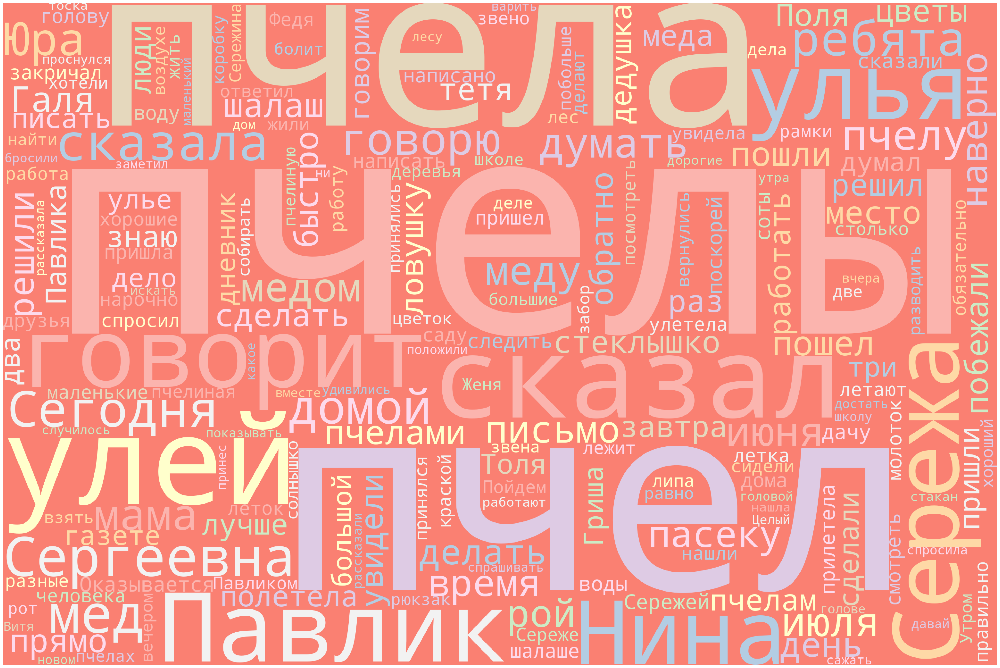

In [22]:
filtered_text = re.sub(r'==.*?==+', '', filtered_text) 
filtered_text = filtered_text.replace('\n', '') 
def plot_cloud(wordcloud): 
    plt.figure(figsize=(50, 40)) 
    plt.imshow(wordcloud)  
    plt.axis("off") 
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(filtered_text) 
plot_cloud(wordcloud)

## Витя Малеев в школе и дома

In [25]:
with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
wordpunct = nltk.tokenize.WordPunctTokenizer()
print(wordpunct.tokenize(text))

['Николай', 'Носов', '.', 'Витя', 'Малеев', 'в', 'школе', 'и', 'дома', '.', 'ГЛАВА', 'ПЕРВАЯ', 'Подумать', 'только', ',', 'как', 'быстро', 'время', 'летит', '!', 'Не', 'успел', 'я', 'оглянуться', ',', 'как', 'каникулы', 'кончились', 'и', 'пришла', 'пора', 'идти', 'в', 'школу', '.', 'Целое', 'лето', 'я', 'только', 'и', 'делал', ',', 'что', 'бегал', 'по', 'улицам', 'да', 'играл', 'в', 'футбол', ',', 'а', 'о', 'книжках', 'даже', 'позабыл', 'думать', '.', 'То', 'есть', 'я', 'читал', 'иногда', 'книжки', ',', 'только', 'не', 'учебные', ',', 'а', 'какие', '-', 'нибудь', 'сказки', 'или', 'рассказы', ',', 'а', 'так', 'чтоб', 'позаниматься', 'по', 'русскому', 'языку', 'или', 'по', 'арифметике', '-', 'этого', 'не', 'было', 'По', 'русскому', 'я', 'и', 'так', 'хорошо', 'учился', ',', 'а', 'арифметики', 'не', 'любил', '.', 'Хуже', 'всего', 'для', 'меня', 'было', '-', 'это', 'задачи', 'решать', '.', 'Ольга', 'Николаевна', 'даже', 'хотела', 'дать', 'мне', 'работу', 'на', 'лето', 'по', 'арифметике', ',

In [26]:
with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized

['Николай',
 'Носов',
 '.',
 'Витя',
 'Малеев',
 'в',
 'школе',
 'и',
 'дома',
 '.',
 'ГЛАВА',
 'ПЕРВАЯ',
 'Подумать',
 'только',
 ',',
 'как',
 'быстро',
 'время',
 'летит',
 '!',
 'Не',
 'успел',
 'я',
 'оглянуться',
 ',',
 'как',
 'каникулы',
 'кончились',
 'и',
 'пришла',
 'пора',
 'идти',
 'в',
 'школу',
 '.',
 'Целое',
 'лето',
 'я',
 'только',
 'и',
 'делал',
 ',',
 'что',
 'бегал',
 'по',
 'улицам',
 'да',
 'играл',
 'в',
 'футбол',
 ',',
 'а',
 'о',
 'книжках',
 'даже',
 'позабыл',
 'думать',
 '.',
 'То',
 'есть',
 'я',
 'читал',
 'иногда',
 'книжки',
 ',',
 'только',
 'не',
 'учебные',
 ',',
 'а',
 'какие-нибудь',
 'сказки',
 'или',
 'рассказы',
 ',',
 'а',
 'так',
 'чтоб',
 'позаниматься',
 'по',
 'русскому',
 'языку',
 'или',
 'по',
 'арифметике',
 '-',
 'этого',
 'не',
 'было',
 'По',
 'русскому',
 'я',
 'и',
 'так',
 'хорошо',
 'учился',
 ',',
 'а',
 'арифметики',
 'не',
 'любил',
 '.',
 'Хуже',
 'всего',
 'для',
 'меня',
 'было',
 '-',
 'это',
 'задачи',
 'решать',
 '.',

In [27]:
tagged = nltk.pos_tag(tokenized)
tagged

[('Николай', 'JJ'),
 ('Носов', 'NNP'),
 ('.', '.'),
 ('Витя', 'VB'),
 ('Малеев', 'JJ'),
 ('в', 'NNP'),
 ('школе', 'NNP'),
 ('и', 'NNP'),
 ('дома', 'NNP'),
 ('.', '.'),
 ('ГЛАВА', 'VB'),
 ('ПЕРВАЯ', 'JJ'),
 ('Подумать', 'NNP'),
 ('только', 'NNP'),
 (',', ','),
 ('как', 'NNP'),
 ('быстро', 'NNP'),
 ('время', 'NNP'),
 ('летит', 'NN'),
 ('!', '.'),
 ('Не', 'JJ'),
 ('успел', 'JJ'),
 ('я', 'NN'),
 ('оглянуться', 'NN'),
 (',', ','),
 ('как', 'NNP'),
 ('каникулы', 'NNP'),
 ('кончились', 'NNP'),
 ('и', 'NNP'),
 ('пришла', 'NNP'),
 ('пора', 'NNP'),
 ('идти', 'NNP'),
 ('в', 'NNP'),
 ('школу', 'NNP'),
 ('.', '.'),
 ('Целое', 'VB'),
 ('лето', 'JJ'),
 ('я', 'NNP'),
 ('только', 'NNP'),
 ('и', 'NNP'),
 ('делал', 'NNP'),
 (',', ','),
 ('что', 'NNP'),
 ('бегал', 'NNP'),
 ('по', 'NNP'),
 ('улицам', 'NNP'),
 ('да', 'NNP'),
 ('играл', 'NNP'),
 ('в', 'NNP'),
 ('футбол', 'NNP'),
 (',', ','),
 ('а', 'NNP'),
 ('о', 'NNP'),
 ('книжках', 'NNP'),
 ('даже', 'NNP'),
 ('позабыл', 'NNP'),
 ('думать', 'NNP'),
 ('.', '

In [28]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Николай',
 'Носов',
 '.',
 'Витя',
 'Малеев',
 'в',
 'школе',
 'и',
 'дома',
 '.',
 'ГЛАВА',
 'ПЕРВАЯ',
 'Подумать',
 'только',
 ',',
 'как',
 'быстро',
 'время',
 'летит',
 '!',
 'Не',
 'успел',
 'я',
 'оглянуться',
 ',',
 'как',
 'каникулы',
 'кончились',
 'и',
 'пришла',
 'пора',
 'идти',
 'в',
 'школу',
 '.',
 'Целое',
 'лето',
 'я',
 'только',
 'и',
 'делал',
 ',',
 'что',
 'бегал',
 'по',
 'улицам',
 'да',
 'играл',
 'в',
 'футбол',
 ',',
 'а',
 'о',
 'книжках',
 'даже',
 'позабыл',
 'думать',
 '.',
 'То',
 'есть',
 'я',
 'читал',
 'иногда',
 'книжки',
 ',',
 'только',
 'не',
 'учебные',
 ',',
 'а',
 'какие-нибудь',
 'сказки',
 'или',
 'рассказы',
 ',',
 'а',
 'так',
 'чтоб',
 'позаниматься',
 'по',
 'русскому',
 'языку',
 'или',
 'по',
 'арифметике',
 '-',
 'этого',
 'не',
 'было',
 'По',
 'русскому',
 'я',
 'и',
 'так',
 'хорошо',
 'учился',
 ',',
 'а',
 'арифметики',
 'не',
 'любил',
 '.',
 'Хуже',
 'всего',
 'для',
 'меня',
 'было',
 '-',
 'это',
 'задачи',
 'решать',
 '.',

In [29]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('C'):
        return nltk.corpus.wordnet.CD
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Николай', 'JJ'),
 ('Носов', 'NNP'),
 ('.', '.'),
 ('Витя', 'VB'),
 ('Малеев', 'JJ'),
 ('в', 'NNP'),
 ('школе', 'NNP'),
 ('и', 'NNP'),
 ('дома', 'NNP'),
 ('.', '.'),
 ('ГЛАВА', 'VB'),
 ('ПЕРВАЯ', 'JJ'),
 ('Подумать', 'NNP'),
 ('только', 'NNP'),
 (',', ','),
 ('как', 'NNP'),
 ('быстро', 'NNP'),
 ('время', 'NNP'),
 ('летит', 'NN'),
 ('!', '.'),
 ('Не', 'JJ'),
 ('успел', 'JJ'),
 ('я', 'NN'),
 ('оглянуться', 'NN'),
 (',', ','),
 ('как', 'NNP'),
 ('каникулы', 'NNP'),
 ('кончились', 'NNP'),
 ('и', 'NNP'),
 ('пришла', 'NNP'),
 ('пора', 'NNP'),
 ('идти', 'NNP'),
 ('в', 'NNP'),
 ('школу', 'NNP'),
 ('.', '.'),
 ('Целое', 'VB'),
 ('лето', 'JJ'),
 ('я', 'NNP'),
 ('только', 'NNP'),
 ('и', 'NNP'),
 ('делал', 'NNP'),
 (',', ','),
 ('что', 'NNP'),
 ('бегал', 'NNP'),
 ('по', 'NNP'),
 ('улицам', 'NNP'),
 ('да', 'NNP'),
 ('играл', 'NNP'),
 ('в', 'NNP'),
 ('футбол', 'NNP'),
 (',', ','),
 ('а', 'NNP'),
 ('о', 'NNP'),
 ('книжках', 'NNP'),
 ('даже', 'NNP'),
 ('позабыл', 'NNP'),
 ('думать', 'NNP'),
 ('.', '

In [30]:
stemmer = SnowballStemmer(language='russian')
with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
stemmed = [stemmer.stem(word) for word in tokenized]
stemmed

['никола',
 'нос',
 '.',
 'вит',
 'мале',
 'в',
 'школ',
 'и',
 'дом',
 '.',
 'глав',
 'перв',
 'подума',
 'тольк',
 ',',
 'как',
 'быстр',
 'врем',
 'лет',
 '!',
 'не',
 'успел',
 'я',
 'оглянут',
 ',',
 'как',
 'каникул',
 'конч',
 'и',
 'пришл',
 'пор',
 'идт',
 'в',
 'школ',
 '.',
 'цел',
 'лет',
 'я',
 'тольк',
 'и',
 'дела',
 ',',
 'что',
 'бега',
 'по',
 'улиц',
 'да',
 'игра',
 'в',
 'футбол',
 ',',
 'а',
 'о',
 'книжк',
 'даж',
 'позаб',
 'дума',
 '.',
 'то',
 'ест',
 'я',
 'чита',
 'иногд',
 'книжк',
 ',',
 'тольк',
 'не',
 'учебн',
 ',',
 'а',
 'какие-нибуд',
 'сказк',
 'ил',
 'рассказ',
 ',',
 'а',
 'так',
 'чтоб',
 'позанима',
 'по',
 'русск',
 'язык',
 'ил',
 'по',
 'арифметик',
 '-',
 'эт',
 'не',
 'был',
 'по',
 'русск',
 'я',
 'и',
 'так',
 'хорош',
 'уч',
 ',',
 'а',
 'арифметик',
 'не',
 'люб',
 '.',
 'хуж',
 'всег',
 'для',
 'мен',
 'был',
 '-',
 'эт',
 'задач',
 'реша',
 '.',
 'ольг',
 'николаевн',
 'даж',
 'хотел',
 'дат',
 'мне',
 'работ',
 'на',
 'лет',
 'по',
 

In [ ]:
SnowballStemmer(language="russian")

In [31]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
    
type(text)

str

In [32]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized
morph.parse(text)

[Parse(word='   николай носов.\n   витя малеев в школе и дома.\n\n\n   глава первая\n   подумать только, как быстро время  летит!  не  успел  я  оглянуться,  как\nканикулы кончились и пришла пора идти в школу. целое лето я только и  делал,\nчто бегал по улицам да играл в футбол, а о книжках даже позабыл  думать.  то\nесть я читал иногда книжки, только не учебные,  а  какие-нибудь  сказки  или\nрассказы, а так чтоб позаниматься по русскому  языку  или  по  арифметике  -\nэтого не было по русскому я и так хорошо учился, а арифметики не любил. хуже\nвсего для меня было - это задачи решать. ольга николаевна даже  хотела  дать\nмне работу на лето по арифметике, но потом пожалела и перевела  в  четвертый\nкласс так, без работы.\n   - не хочется тебе лето портить, - сказала она. - я переведу тебя так,  но\nты дай обещание, что сам позанимаешься по арифметике летом.\n   я,  конечно,  обещание  дал,  но,  как  только  занятия  кончились,   вся\nарифметика выскочила у меня из головы, и я, наверн

In [33]:
m=Mystem()
m.analyze('ГЛАВА ПЕРВАЯ Подумать только, как быстро время  летит!  Не  успел  я  оглянуться,  какканикулы кончились и пришла пора идти в школу. Целое лето я только и  делал,что бегал по улицам да играл в футбол, а о книжках даже позабыл  думать.  Тоесть я читал иногда книжки, только не учебные,  а  какие-нибудь  сказки  илирассказы, а так чтоб позаниматься по русскому  языку  или  по  арифметике  -этого не было По русскому я и так хорошо учился, а арифметики не любил. Хужевсего для меня было - это задачи решать. Ольга Николаевна даже  хотела  датьмне работу на лето по арифметике, но потом пожалела и перевела  в  четвертыйкласс так, без работы.- Не хочется тебе лето портить, - сказала она. - Я переведу тебя так,  ноты дай обещание, что сам позанимаешься по арифметике летом.Я,  конечно,  обещание  дал,  но,  как  только  занятия  кончились,   всяарифметика выскочила у меня из головы, и я, наверно, так и не вспомнил бы  оней, если б не пришла пора идти в школу. Стыдно было мне, что я не  исполнилсвоего обещания, но теперь уж все равно ничего не поделаешь.Ну и вот, значит, пролетели каникулы! В одно прекрасное утро -  это  былопервого сентября -  я  встал  пораньше,  сложил  свои  книжечки  в  сумку  иотправился в школу. В этот день на  улице,  как  говорится,  царило  большоеоживление. Все мальчики и девочки, и большие и маленькие,  как  по  команде,высыпали на улицу и шагали в школу. Они шли и по одному, и по двое,  и  дажецелыми группами по нескольку человек. Кто шел  не  спеша,  вроде  меня,  ктомчался стремглав, как на пожар. Малыши тащили цветы, чтобы  украсить  класс.')

[{'analysis': [{'lex': 'глава', 'wt': 0.4817952128, 'gr': 'S,жен,неод=им,ед'}],
  'text': 'ГЛАВА'},
 {'text': ' '},
 {'analysis': [{'lex': 'перваяподумать',
    'wt': 1,
    'qual': 'bastard',
    'gr': 'V,сов,нп=инф'}],
  'text': 'ПЕРВАЯПодумать'},
 {'text': ' '},
 {'analysis': [{'lex': 'только', 'wt': 0.9073895266, 'gr': 'PART='}],
  'text': 'только'},
 {'text': ', '},
 {'analysis': [{'lex': 'как', 'wt': 0.3756069802, 'gr': 'ADVPRO='}],
  'text': 'как'},
 {'text': ' '},
 {'analysis': [{'lex': 'быстро', 'wt': 0.9972694661, 'gr': 'ADV='}],
  'text': 'быстро'},
 {'text': ' '},
 {'analysis': [{'lex': 'время', 'wt': 1, 'gr': 'S,сред,неод=(вин,ед|им,ед)'}],
  'text': 'время'},
 {'text': '  '},
 {'analysis': [{'lex': 'лететь',
    'wt': 1,
    'gr': 'V,несов,нп=непрош,ед,изъяв,3-л'}],
  'text': 'летит'},
 {'text': '!  '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'Не'},
 {'text': '  '},
 {'analysis': [{'lex': 'успевать',
    'wt': 1,
    'gr': 'V,нп=прош,ед,изъяв,муж,со

In [34]:
m=Mystem()
m.analyze('Яркое солнышко сияло на небе  по-летнему,  но  прохладный  осенний  ветерсрывал с деревьев пожелтевшие листья. Они кружились в воздухе и падали вниз.Ветер гнал их по тротуару, и казалось, что листочки тоже куда-то спешат.Еще издали я увидел над входом в школу большой  красный  плакат.  Он  былувит со всех сторон гирляндами из цветов, а на нем  было  написано  большимибелыми буквами: Добро пожаловать! Я вспомнил, что такой же плакат висел  вэтот день здесь и в прошлом году, и в позапрошлом, и в  тот  день,  когда  ясовсем еще маленьким пришел первый  раз  в  школу.  И  мне  вспомнились  всепрошлые годы. Как мы учились в первом классе и мечтали поскорей  подрасти  истать пионерами.Все это вспомнилось мне, и какая-то радость встрепенулась у меня в груди,будто  случилось  что-то  хорошее-хорошее!  Ноги  мои  сами  собой  зашагалибыстрей, и я еле удержался, чтоб не пуститься бегом. Но это было  мне  не  клицу: ведь я не какой-нибудь первоклассник - как-никак,  все-таки  четвертый класс!')

[{'analysis': [{'lex': 'яркий',
    'wt': 1,
    'gr': 'A=(вин,ед,полн,сред|им,ед,полн,сред)'}],
  'text': 'Яркое'},
 {'text': ' '},
 {'analysis': [{'lex': 'солнышко',
    'wt': 1,
    'gr': 'S,сред,неод=(вин,ед|им,ед)'}],
  'text': 'солнышко'},
 {'text': ' '},
 {'analysis': [{'lex': 'сиять',
    'wt': 1,
    'gr': 'V,несов,нп=прош,ед,изъяв,сред'}],
  'text': 'сияло'},
 {'text': ' '},
 {'analysis': [{'lex': 'на', 'wt': 0.9989522965, 'gr': 'PR='}], 'text': 'на'},
 {'text': ' '},
 {'analysis': [{'lex': 'небо', 'wt': 0.6573029006, 'gr': 'S,сред,неод=пр,ед'}],
  'text': 'небе'},
 {'text': '  '},
 {'analysis': [{'lex': 'по-летнему', 'wt': 1, 'gr': 'ADV='}],
  'text': 'по-летнему'},
 {'text': ',  '},
 {'analysis': [{'lex': 'но', 'wt': 0.9998906299, 'gr': 'CONJ='}],
  'text': 'но'},
 {'text': '  '},
 {'analysis': [{'lex': 'прохладный',
    'wt': 1,
    'gr': 'A=(вин,ед,полн,муж,неод|им,ед,полн,муж)'}],
  'text': 'прохладный'},
 {'text': '  '},
 {'analysis': [{'lex': 'осенний',
    'wt': 1,
  

In [35]:
import string

class Tokenizer:
    @staticmethod
    def tokenizer(text):
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        tokens = text.split()

        return tokens

In [36]:
import spacy
nlp = spacy.load('ru_core_news_sm')

def remove_stopwords(text):
    nlp = spacy.load('ru_core_news_sm')
    doc = nlp(text)
    words = [token.text for token in doc if not token.is_stop and token.pos_ not in {'ADP', 'PRON', 'PART'}]
    filtered_text = ' '.join(words)

    return filtered_text


with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
filtered_text = remove_stopwords(text)
print(filtered_text)

    Николай Носов . 
    Витя Малеев школе дома . 


    ГЛАВА ПЕРВАЯ 
    Подумать , быстро время   летит !     успел     оглянуться ,   
 каникулы кончились пришла идти школу . Целое лето   делал , 
 бегал улицам играл футбол , книжках позабыл   думать .   
 читал книжки , учебные ,     -   сказки   
 рассказы , позаниматься русскому   языку       арифметике   - 
 русскому учился , арифметики любил . 
 - задачи решать . Ольга Николаевна     дать 
 работу лето арифметике , пожалела перевела     четвертый 
 класс , работы . 
    - хочется лето портить , - сказала . - переведу ,   
 дай обещание , позанимаешься арифметике летом . 
    ,   ,   обещание   дал ,   ,       занятия   кончились ,    
 арифметика выскочила головы , , наверно , вспомнил   
 , пришла идти школу . Стыдно ,   исполнил 
 обещания , равно поделаешь . 
    , , пролетели каникулы ! прекрасное утро -     
 первого сентября -     встал   пораньше ,   сложил     книжечки     сумку   
 отправился школу . день   улице ,   

In [38]:
with open("Vitya_Maleev_v_shkole_i_doma.txt") as file:
    text = file.read()
tokenizer = Tokenizer()
tokens = tokenizer.tokenizer(text)
print(tokens)
m=Mystem()
m.analyze('ГЛАВА ПЕРВАЯПодумать только, как быстро время  летит!  Не  успел  я  оглянуться,  какканикулы кончились и пришла пора идти в школу. Целое лето я только и  делал,что бегал по улицам да играл в футбол, а о книжках даже позабыл  думать.  Тоесть я читал иногда книжки, только не учебные,  а  какие-нибудь  сказки  илирассказы, а так чтоб позаниматься по русскому  языку  или  по  арифметике  -этого не было По русскому я и так хорошо учился, а арифметики не любил. Хужевсего для меня было - это задачи решать. Ольга Николаевна даже  хотела  датьмне работу на лето по арифметике, но потом пожалела и перевела  в  четвертыйкласс так, без работы.- Не хочется тебе лето портить, - сказала она. - Я переведу тебя так,  ноты дай обещание, что сам позанимаешься по арифметике летом.Я,  конечно,  обещание  дал,  но,  как  только  занятия  кончились,   всяарифметика выскочила у меня из головы, и я, наверно, так и не вспомнил бы  оней, если б не пришла пора идти в школу. Стыдно было мне, что я не  исполнилсвоего обещания, но теперь уж все равно ничего не поделаешь.Ну и вот, значит, пролетели каникулы! В одно прекрасное утро -  это  былопервого сентября -  я  встал  пораньше,  сложил  свои  книжечки  в  сумку  иотправился в школу. В этот день на  улице,  как  говорится,  царило  большоеоживление. Все мальчики и девочки, и большие и маленькие,  как  по  команде,высыпали на улицу и шагали в школу. Они шли и по одному, и по двое,  и  дажецелыми группами по нескольку человек. Кто шел  не  спеша,  вроде  меня,  ктомчался стремглав, как на пожар. Малыши тащили цветы, чтобы  украсить  класс.')

['Николай', 'Носов', 'Витя', 'Малеев', 'в', 'школе', 'и', 'дома', 'ГЛАВА', 'ПЕРВАЯ', 'Подумать', 'только', 'как', 'быстро', 'время', 'летит', 'Не', 'успел', 'я', 'оглянуться', 'как', 'каникулы', 'кончились', 'и', 'пришла', 'пора', 'идти', 'в', 'школу', 'Целое', 'лето', 'я', 'только', 'и', 'делал', 'что', 'бегал', 'по', 'улицам', 'да', 'играл', 'в', 'футбол', 'а', 'о', 'книжках', 'даже', 'позабыл', 'думать', 'То', 'есть', 'я', 'читал', 'иногда', 'книжки', 'только', 'не', 'учебные', 'а', 'какиенибудь', 'сказки', 'или', 'рассказы', 'а', 'так', 'чтоб', 'позаниматься', 'по', 'русскому', 'языку', 'или', 'по', 'арифметике', 'этого', 'не', 'было', 'По', 'русскому', 'я', 'и', 'так', 'хорошо', 'учился', 'а', 'арифметики', 'не', 'любил', 'Хуже', 'всего', 'для', 'меня', 'было', 'это', 'задачи', 'решать', 'Ольга', 'Николаевна', 'даже', 'хотела', 'дать', 'мне', 'работу', 'на', 'лето', 'по', 'арифметике', 'но', 'потом', 'пожалела', 'и', 'перевела', 'в', 'четвертый', 'класс', 'так', 'без', 'работы', '

[{'analysis': [{'lex': 'глава', 'wt': 0.4817952128, 'gr': 'S,жен,неод=им,ед'}],
  'text': 'ГЛАВА'},
 {'text': ' '},
 {'analysis': [{'lex': 'перваяподумать',
    'wt': 1,
    'qual': 'bastard',
    'gr': 'V,сов,нп=инф'}],
  'text': 'ПЕРВАЯПодумать'},
 {'text': ' '},
 {'analysis': [{'lex': 'только', 'wt': 0.9073895266, 'gr': 'PART='}],
  'text': 'только'},
 {'text': ', '},
 {'analysis': [{'lex': 'как', 'wt': 0.3756069802, 'gr': 'ADVPRO='}],
  'text': 'как'},
 {'text': ' '},
 {'analysis': [{'lex': 'быстро', 'wt': 0.9972694661, 'gr': 'ADV='}],
  'text': 'быстро'},
 {'text': ' '},
 {'analysis': [{'lex': 'время', 'wt': 1, 'gr': 'S,сред,неод=(вин,ед|им,ед)'}],
  'text': 'время'},
 {'text': '  '},
 {'analysis': [{'lex': 'лететь',
    'wt': 1,
    'gr': 'V,несов,нп=непрош,ед,изъяв,3-л'}],
  'text': 'летит'},
 {'text': '!  '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'Не'},
 {'text': '  '},
 {'analysis': [{'lex': 'успевать',
    'wt': 1,
    'gr': 'V,нп=прош,ед,изъяв,муж,со

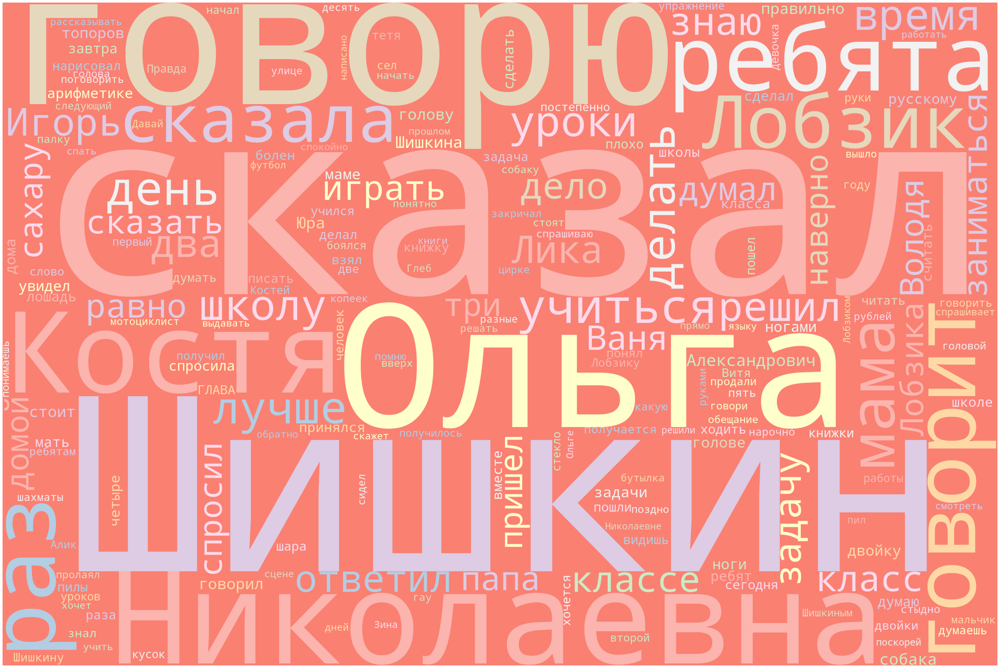

In [39]:
import re 
import matplotlib.pyplot as plt 
from wordcloud import WordCloud, STOPWORDS 
filtered_text = re.sub(r'==.*?==+', '', filtered_text) 
filtered_text = filtered_text.replace('\n', '') 
def plot_cloud(wordcloud): 
    plt.figure(figsize=(50, 40)) 
    plt.imshow(wordcloud)  
    plt.axis("off") 
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(filtered_text) 
plot_cloud(wordcloud)

## Фантазеры

In [40]:
with open("57373628.txt") as file:
    text = file.read()
wordpunct = nltk.tokenize.WordPunctTokenizer()
print(wordpunct.tokenize(text))

['Фантазеры', 'Николай', 'Николаевич', 'Носов', 'Классика', 'нашего', 'детства', 'Весёлые', 'и', 'поучительные', 'рассказы', 'знаменитого', 'писателя', 'Николая', 'Носова', 'с', 'иллюстрациями', 'не', 'менее', 'знаменитого', 'художника', 'Германа', 'Огородникова', 'давно', 'стали', 'классикой', '.', 'Их', 'знают', 'и', 'любят', 'миллионы', 'детей', 'в', 'нашей', 'стране', '.', 'А', 'всё', 'потому', ',', 'что', 'герои', 'этих', 'рассказов', '–', 'такие', 'же', 'обычные', 'ребята', ',', 'любознательные', ',', 'искренние', ',', 'честные', ',', 'ценящие', 'дружбу', '.', 'Они', 'никогда', 'не', 'скучают', 'и', 'всегда', 'заняты', 'каким', '-', 'нибудь', 'интересным', 'делом', '.', 'Николай', 'Николаевич', 'Носов', 'Фантазёры', 'Фантазеры', 'Мишутка', 'и', 'Стасик', 'сидели', 'в', 'саду', 'на', 'скамеечке', 'и', 'разговаривали', '.', 'Только', 'они', 'разговаривали', 'не', 'просто', ',', 'как', 'другие', 'ребята', ',', 'а', 'рассказывали', 'друг', 'другу', 'разные', 'небылицы', ',', 'будто',

In [41]:
with open("57373628.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized

['Фантазеры',
 'Николай',
 'Николаевич',
 'Носов',
 'Классика',
 'нашего',
 'детства',
 'Весёлые',
 'и',
 'поучительные',
 'рассказы',
 'знаменитого',
 'писателя',
 'Николая',
 'Носова',
 'с',
 'иллюстрациями',
 'не',
 'менее',
 'знаменитого',
 'художника',
 'Германа',
 'Огородникова',
 'давно',
 'стали',
 'классикой',
 '.',
 'Их',
 'знают',
 'и',
 'любят',
 'миллионы',
 'детей',
 'в',
 'нашей',
 'стране',
 '.',
 'А',
 'всё',
 'потому',
 ',',
 'что',
 'герои',
 'этих',
 'рассказов',
 '–',
 'такие',
 'же',
 'обычные',
 'ребята',
 ',',
 'любознательные',
 ',',
 'искренние',
 ',',
 'честные',
 ',',
 'ценящие',
 'дружбу',
 '.',
 'Они',
 'никогда',
 'не',
 'скучают',
 'и',
 'всегда',
 'заняты',
 'каким-нибудь',
 'интересным',
 'делом',
 '.',
 'Николай',
 'Николаевич',
 'Носов',
 'Фантазёры',
 'Фантазеры',
 'Мишутка',
 'и',
 'Стасик',
 'сидели',
 'в',
 'саду',
 'на',
 'скамеечке',
 'и',
 'разговаривали',
 '.',
 'Только',
 'они',
 'разговаривали',
 'не',
 'просто',
 ',',
 'как',
 'другие',
 '

In [42]:
tagged = nltk.pos_tag(tokenized)
tagged

[('Фантазеры', 'JJ'),
 ('Николай', 'NNP'),
 ('Николаевич', 'NNP'),
 ('Носов', 'NNP'),
 ('Классика', 'NNP'),
 ('нашего', 'NNP'),
 ('детства', 'NNP'),
 ('Весёлые', 'NNP'),
 ('и', 'NNP'),
 ('поучительные', 'NNP'),
 ('рассказы', 'NNP'),
 ('знаменитого', 'NNP'),
 ('писателя', 'NNP'),
 ('Николая', 'NNP'),
 ('Носова', 'NNP'),
 ('с', 'NNP'),
 ('иллюстрациями', 'NNP'),
 ('не', 'NNP'),
 ('менее', 'NNP'),
 ('знаменитого', 'NNP'),
 ('художника', 'NNP'),
 ('Германа', 'NNP'),
 ('Огородникова', 'NNP'),
 ('давно', 'NNP'),
 ('стали', 'NNP'),
 ('классикой', 'NNP'),
 ('.', '.'),
 ('Их', 'VB'),
 ('знают', 'JJ'),
 ('и', 'NNP'),
 ('любят', 'NNP'),
 ('миллионы', 'NNP'),
 ('детей', 'NNP'),
 ('в', 'NNP'),
 ('нашей', 'NNP'),
 ('стране', 'NNP'),
 ('.', '.'),
 ('А', 'VB'),
 ('всё', 'JJ'),
 ('потому', 'NNP'),
 (',', ','),
 ('что', 'NNP'),
 ('герои', 'NNP'),
 ('этих', 'NNP'),
 ('рассказов', 'NNP'),
 ('–', 'NNP'),
 ('такие', 'NNP'),
 ('же', 'NNP'),
 ('обычные', 'NNP'),
 ('ребята', 'NNP'),
 (',', ','),
 ('любознатель

In [43]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Фантазеры',
 'Николай',
 'Николаевич',
 'Носов',
 'Классика',
 'нашего',
 'детства',
 'Весёлые',
 'и',
 'поучительные',
 'рассказы',
 'знаменитого',
 'писателя',
 'Николая',
 'Носова',
 'с',
 'иллюстрациями',
 'не',
 'менее',
 'знаменитого',
 'художника',
 'Германа',
 'Огородникова',
 'давно',
 'стали',
 'классикой',
 '.',
 'Их',
 'знают',
 'и',
 'любят',
 'миллионы',
 'детей',
 'в',
 'нашей',
 'стране',
 '.',
 'А',
 'всё',
 'потому',
 ',',
 'что',
 'герои',
 'этих',
 'рассказов',
 '–',
 'такие',
 'же',
 'обычные',
 'ребята',
 ',',
 'любознательные',
 ',',
 'искренние',
 ',',
 'честные',
 ',',
 'ценящие',
 'дружбу',
 '.',
 'Они',
 'никогда',
 'не',
 'скучают',
 'и',
 'всегда',
 'заняты',
 'каким-нибудь',
 'интересным',
 'делом',
 '.',
 'Николай',
 'Николаевич',
 'Носов',
 'Фантазёры',
 'Фантазеры',
 'Мишутка',
 'и',
 'Стасик',
 'сидели',
 'в',
 'саду',
 'на',
 'скамеечке',
 'и',
 'разговаривали',
 '.',
 'Только',
 'они',
 'разговаривали',
 'не',
 'просто',
 ',',
 'как',
 'другие',
 '

In [44]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('C'):
        return nltk.corpus.wordnet.CD
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Фантазеры', 'JJ'),
 ('Николай', 'NNP'),
 ('Николаевич', 'NNP'),
 ('Носов', 'NNP'),
 ('Классика', 'NNP'),
 ('нашего', 'NNP'),
 ('детства', 'NNP'),
 ('Весёлые', 'NNP'),
 ('и', 'NNP'),
 ('поучительные', 'NNP'),
 ('рассказы', 'NNP'),
 ('знаменитого', 'NNP'),
 ('писателя', 'NNP'),
 ('Николая', 'NNP'),
 ('Носова', 'NNP'),
 ('с', 'NNP'),
 ('иллюстрациями', 'NNP'),
 ('не', 'NNP'),
 ('менее', 'NNP'),
 ('знаменитого', 'NNP'),
 ('художника', 'NNP'),
 ('Германа', 'NNP'),
 ('Огородникова', 'NNP'),
 ('давно', 'NNP'),
 ('стали', 'NNP'),
 ('классикой', 'NNP'),
 ('.', '.'),
 ('Их', 'VB'),
 ('знают', 'JJ'),
 ('и', 'NNP'),
 ('любят', 'NNP'),
 ('миллионы', 'NNP'),
 ('детей', 'NNP'),
 ('в', 'NNP'),
 ('нашей', 'NNP'),
 ('стране', 'NNP'),
 ('.', '.'),
 ('А', 'VB'),
 ('всё', 'JJ'),
 ('потому', 'NNP'),
 (',', ','),
 ('что', 'NNP'),
 ('герои', 'NNP'),
 ('этих', 'NNP'),
 ('рассказов', 'NNP'),
 ('–', 'NNP'),
 ('такие', 'NNP'),
 ('же', 'NNP'),
 ('обычные', 'NNP'),
 ('ребята', 'NNP'),
 (',', ','),
 ('любознатель

In [45]:
stemmer = SnowballStemmer(language='russian')
with open("57373628.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
stemmed = [stemmer.stem(word) for word in tokenized]
stemmed

['фантазер',
 'никола',
 'николаевич',
 'нос',
 'классик',
 'наш',
 'детств',
 'весел',
 'и',
 'поучительн',
 'рассказ',
 'знаменит',
 'писател',
 'никол',
 'носов',
 'с',
 'иллюстрац',
 'не',
 'мен',
 'знаменит',
 'художник',
 'герма',
 'огородников',
 'давн',
 'стал',
 'классик',
 '.',
 'их',
 'знают',
 'и',
 'люб',
 'миллион',
 'дет',
 'в',
 'наш',
 'стран',
 '.',
 'а',
 'все',
 'пот',
 ',',
 'что',
 'геро',
 'эт',
 'рассказ',
 '–',
 'так',
 'же',
 'обычн',
 'ребят',
 ',',
 'любознательн',
 ',',
 'искрен',
 ',',
 'честн',
 ',',
 'ценя',
 'дружб',
 '.',
 'он',
 'никогд',
 'не',
 'скуча',
 'и',
 'всегд',
 'занят',
 'каким-нибуд',
 'интересн',
 'дел',
 '.',
 'никола',
 'николаевич',
 'нос',
 'фантазер',
 'фантазер',
 'мишутк',
 'и',
 'стасик',
 'сидел',
 'в',
 'сад',
 'на',
 'скамеечк',
 'и',
 'разговарива',
 '.',
 'тольк',
 'он',
 'разговарива',
 'не',
 'прост',
 ',',
 'как',
 'друг',
 'ребят',
 ',',
 'а',
 'рассказыва',
 'друг',
 'друг',
 'разн',
 'небылиц',
 ',',
 'будт',
 'пошл',
 

In [46]:
SnowballStemmer(language="russian")

In [47]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("57373628.txt") as file:
    text = file.read()
    
type(text)

str

In [48]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("57373628.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized
morph.parse(text)

[Parse(word='фантазеры\nниколай николаевич носов\n\n\nклассика нашего детства\nвесёлые и поучительные рассказы знаменитого писателя николая носова с иллюстрациями не менее знаменитого художника германа огородникова давно стали классикой. их знают и любят миллионы детей в нашей стране.\n\nа всё потому, что герои этих рассказов – такие же обычные ребята, любознательные, искренние, честные, ценящие дружбу. они никогда не скучают и всегда заняты каким-нибудь интересным делом.\n\n\n\n\n\nниколай николаевич носов\n\nфантазёры\n\n\n\n\n\n\n\n\n\n\n\nфантазеры\n\n\n\n\n\nмишутка и\xa0стасик сидели в саду на скамеечке и разговаривали. только они разговаривали не просто, как другие ребята, а рассказывали друг другу разные небылицы, будто пошли на спор, кто кого переврёт.\n\n–\xa0сколько тебе лет?\xa0– спрашивает мишутка.\n\n–\xa0девяносто пять. а тебе?\n\n–\xa0а мне сто сорок. знаешь,\xa0– говорит мишутка,\xa0– раньше я был большой-большой, как дядя боря, а потом сделался маленький.\n\n–\xa0а я,

In [49]:
m=Mystem()
m.analyze('Пыль из пиджака так и полетела в трубу, а вместе с пылью и пуговицы.Потом они стали чистить штанишки Пончика. А у Пончика в карманах всегда лежали конфеты. Пылесос был такой мощный, что даже конфеты повысасывал из карманов.После этого они стали чистить курточку Знайки, и тут только Шпунтик заметил, что из кармана вытащило Знайкину вечную ручку. Он хотел прекратить работу, но Винтик сказал:– Ничего, потом откроем пылесос и достанем.– А теперь почистим диван, – предложил Шпунтик.Они стали чистить диван. Гвозди из обшивки так и выскакивали и исчезали в трубе.Обшивка постепенно разлезлась, пружины повыскакивали, спинка отвалилась, диван рассыпался на кусочки, и вся диванная начинка полетела в трубу.Дело кончилось тем, что в трубе застряла диванная ножка и пылесос ничего больше не мог всасывать.– Ну и ладно, – сказал Винтик. – Ляжем спать, а когда встанем, починим диван и вытащим из пылесоса все гвозди.Друзья легли спать и моментально заснули.')

[{'analysis': [{'lex': 'пыль', 'wt': 1, 'gr': 'S,жен,неод=(вин,ед|им,ед)'}],
  'text': 'Пыль'},
 {'text': ' '},
 {'analysis': [{'lex': 'из', 'wt': 0.9999999775, 'gr': 'PR='}], 'text': 'из'},
 {'text': ' '},
 {'analysis': [{'lex': 'пиджак', 'wt': 1, 'gr': 'S,муж,неод=род,ед'}],
  'text': 'пиджака'},
 {'text': ' '},
 {'analysis': [{'lex': 'так', 'wt': 0.9840554802, 'gr': 'ADVPRO='}],
  'text': 'так'},
 {'text': ' '},
 {'analysis': [{'lex': 'и', 'wt': 0.9999770357, 'gr': 'CONJ='}], 'text': 'и'},
 {'text': ' '},
 {'analysis': [{'lex': 'полететь',
    'wt': 1,
    'gr': 'V,сов,нп=прош,ед,изъяв,жен'}],
  'text': 'полетела'},
 {'text': ' '},
 {'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'в'},
 {'text': ' '},
 {'analysis': [{'lex': 'труба', 'wt': 1, 'gr': 'S,жен,неод=вин,ед'}],
  'text': 'трубу'},
 {'text': ', '},
 {'analysis': [{'lex': 'а', 'wt': 0.9822148501, 'gr': 'CONJ='}], 'text': 'а'},
 {'text': ' '},
 {'analysis': [{'lex': 'вместе', 'wt': 1, 'gr': 'ADV='}], 'tex

In [50]:
m=Mystem()
m.analyze('Мишутка и Стасик сидели в саду на скамеечке и разговаривали. Только они разговаривали не просто, как другие ребята, а рассказывали друг другу разные небылицы, будто пошли на спор, кто кого перевр Сколько тебе лет? – спрашивает Мишутка.– Девяносто пять. А тебе– А мне сто сорок. Знаешь, – говорит Мишутка, – раньше я был большой-большой, как дядя Боря, а потом сделался маленький.– А я, – говорит Стасик, – сначала был маленький, а потом вырос большой, а потом снова стал маленький, а теперь опять скоро буду большой.– А я, когда был большой, всю реку мог переплыть, – говорит Мишутка.– У! А я море мог переплыть!– Подумаешь – море! Я океан переплывал!')

[{'analysis': [{'lex': 'мишутка', 'wt': 1, 'gr': 'S,имя,муж,од=им,ед'}],
  'text': 'Мишутка'},
 {'text': ' '},
 {'analysis': [{'lex': 'и', 'wt': 0.9999770357, 'gr': 'CONJ='}], 'text': 'и'},
 {'text': '\xa0'},
 {'analysis': [{'lex': 'стасик', 'wt': 1, 'gr': 'S,имя,муж,од=им,ед'}],
  'text': 'Стасик'},
 {'text': ' '},
 {'analysis': [{'lex': 'сидеть', 'wt': 1, 'gr': 'V,несов,нп=прош,мн,изъяв'}],
  'text': 'сидели'},
 {'text': ' '},
 {'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'в'},
 {'text': ' '},
 {'analysis': [{'lex': 'сад', 'wt': 1, 'gr': 'S,муж,неод=(дат,ед|местн,ед)'}],
  'text': 'саду'},
 {'text': ' '},
 {'analysis': [{'lex': 'на', 'wt': 0.9989522965, 'gr': 'PR='}], 'text': 'на'},
 {'text': ' '},
 {'analysis': [{'lex': 'скамеечка',
    'wt': 1,
    'gr': 'S,жен,неод=(пр,ед|дат,ед)'}],
  'text': 'скамеечке'},
 {'text': ' '},
 {'analysis': [{'lex': 'и', 'wt': 0.9999770357, 'gr': 'CONJ='}], 'text': 'и'},
 {'text': ' '},
 {'analysis': [{'lex': 'разговаривать',


In [51]:
import string

class Tokenizer:
    @staticmethod
    def tokenizer(text):
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        tokens = text.split()

        return tokens

In [52]:
import spacy
nlp = spacy.load('ru_core_news_sm')

def remove_stopwords(text):
    nlp = spacy.load('ru_core_news_sm')
    doc = nlp(text)
    words = [token.text for token in doc if not token.is_stop and token.pos_ not in {'ADP', 'PRON', 'PART'}]
    filtered_text = ' '.join(words)

    return filtered_text


with open("57373628.txt") as file:
    text = file.read()
filtered_text = remove_stopwords(text)
print(filtered_text)

Фантазеры 
 Николай Николаевич Носов 


 Классика детства 
 Весёлые поучительные рассказы знаменитого писателя Николая Носова иллюстрациями знаменитого художника Германа Огородникова классикой . знают любят миллионы детей стране . 

 , герои рассказов – обычные ребята , любознательные , искренние , честные , ценящие дружбу . скучают заняты - интересным делом . 





 Николай Николаевич Носов 

 Фантазёры 











 Фантазеры 





 Мишутка   Стасик сидели саду скамеечке разговаривали . разговаривали , ребята , рассказывали разные небылицы , пошли спор , переврёт . 

 –   лет ?   – спрашивает Мишутка . 

 –   Девяносто пять . ? 

 –   сто сорок . Знаешь ,   – говорит Мишутка ,   – большой - большой , дядя Боря , сделался маленький . 

 –   ,   – говорит Стасик ,   – маленький , вырос большой , маленький , большой . 

 –   , большой , реку переплыть ,   – говорит Мишутка . 

 –   ! море переплыть ! 

 –   Подумаешь – море ! океан переплывал ! 

 –   летать умел ! 

 –   полети ! 

 –  

In [53]:
with open("57373628.txt") as file:
    text = file.read()
tokenizer = Tokenizer()
tokens = tokenizer.tokenizer(text)
print(tokens)
m=Mystem()
m.analyze('Пыль из пиджака так и полетела в трубу, а вместе с пылью и пуговицы.Потом они стали чистить штанишки Пончика. А у Пончика в карманах всегда лежали конфеты. Пылесос был такой мощный, что даже конфеты повысасывал из карманов.После этого они стали чистить курточку Знайки, и тут только Шпунтик заметил, что из кармана вытащило Знайкину вечную ручку. Он хотел прекратить работу, но Винтик сказал:– Ничего, потом откроем пылесос и достанем.– А теперь почистим диван, – предложил Шпунтик.Они стали чистить диван. Гвозди из обшивки так и выскакивали и исчезали в трубе.Обшивка постепенно разлезлась, пружины повыскакивали, спинка отвалилась, диван рассыпался на кусочки, и вся диванная начинка полетела в трубу.Дело кончилось тем, что в трубе застряла диванная ножка и пылесос ничего больше не мог всасывать.– Ну и ладно, – сказал Винтик. – Ляжем спать, а когда встанем, починим диван и вытащим из пылесоса все гвозди.Друзья легли спать и моментально заснули.')

['Фантазеры', 'Николай', 'Николаевич', 'Носов', 'Классика', 'нашего', 'детства', 'Весёлые', 'и', 'поучительные', 'рассказы', 'знаменитого', 'писателя', 'Николая', 'Носова', 'с', 'иллюстрациями', 'не', 'менее', 'знаменитого', 'художника', 'Германа', 'Огородникова', 'давно', 'стали', 'классикой', 'Их', 'знают', 'и', 'любят', 'миллионы', 'детей', 'в', 'нашей', 'стране', 'А', 'всё', 'потому', 'что', 'герои', 'этих', 'рассказов', '–', 'такие', 'же', 'обычные', 'ребята', 'любознательные', 'искренние', 'честные', 'ценящие', 'дружбу', 'Они', 'никогда', 'не', 'скучают', 'и', 'всегда', 'заняты', 'какимнибудь', 'интересным', 'делом', 'Николай', 'Николаевич', 'Носов', 'Фантазёры', 'Фантазеры', 'Мишутка', 'и', 'Стасик', 'сидели', 'в', 'саду', 'на', 'скамеечке', 'и', 'разговаривали', 'Только', 'они', 'разговаривали', 'не', 'просто', 'как', 'другие', 'ребята', 'а', 'рассказывали', 'друг', 'другу', 'разные', 'небылицы', 'будто', 'пошли', 'на', 'спор', 'кто', 'кого', 'переврёт', '–', 'Сколько', 'тебе',

[{'analysis': [{'lex': 'пыль', 'wt': 1, 'gr': 'S,жен,неод=(вин,ед|им,ед)'}],
  'text': 'Пыль'},
 {'text': ' '},
 {'analysis': [{'lex': 'из', 'wt': 0.9999999775, 'gr': 'PR='}], 'text': 'из'},
 {'text': ' '},
 {'analysis': [{'lex': 'пиджак', 'wt': 1, 'gr': 'S,муж,неод=род,ед'}],
  'text': 'пиджака'},
 {'text': ' '},
 {'analysis': [{'lex': 'так', 'wt': 0.9840554802, 'gr': 'ADVPRO='}],
  'text': 'так'},
 {'text': ' '},
 {'analysis': [{'lex': 'и', 'wt': 0.9999770357, 'gr': 'CONJ='}], 'text': 'и'},
 {'text': ' '},
 {'analysis': [{'lex': 'полететь',
    'wt': 1,
    'gr': 'V,сов,нп=прош,ед,изъяв,жен'}],
  'text': 'полетела'},
 {'text': ' '},
 {'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'в'},
 {'text': ' '},
 {'analysis': [{'lex': 'труба', 'wt': 1, 'gr': 'S,жен,неод=вин,ед'}],
  'text': 'трубу'},
 {'text': ', '},
 {'analysis': [{'lex': 'а', 'wt': 0.9822148501, 'gr': 'CONJ='}], 'text': 'а'},
 {'text': ' '},
 {'analysis': [{'lex': 'вместе', 'wt': 1, 'gr': 'ADV='}], 'tex

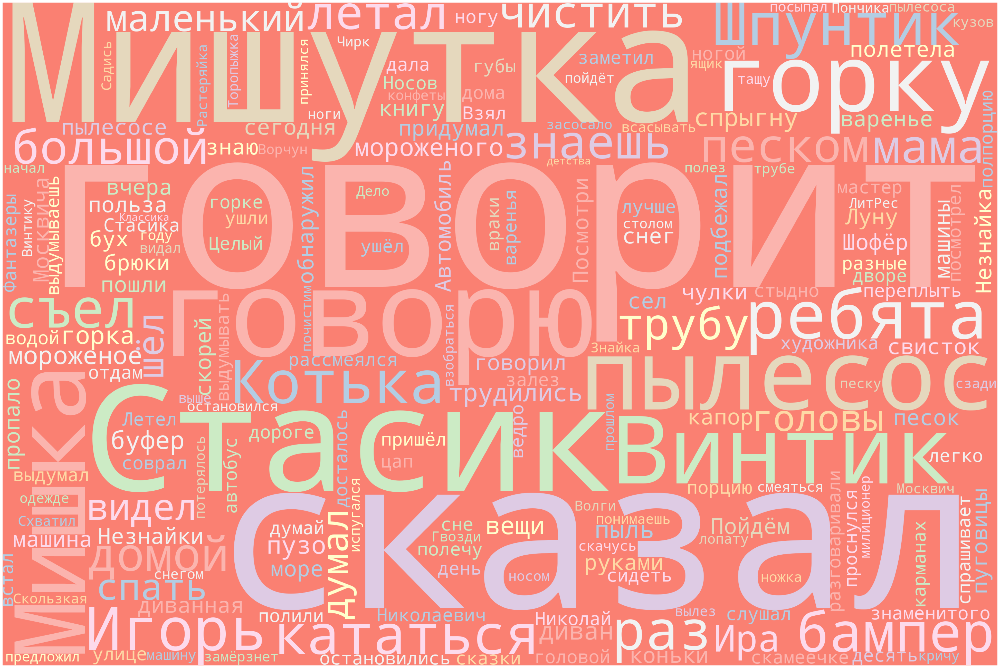

In [54]:
import re 
import matplotlib.pyplot as plt 
from wordcloud import WordCloud, STOPWORDS 
filtered_text = re.sub(r'==.*?==+', '', filtered_text) 
filtered_text = filtered_text.replace('\n', '') 
def plot_cloud(wordcloud): 
    plt.figure(figsize=(50, 40)) 
    plt.imshow(wordcloud)  
    plt.axis("off") 
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(filtered_text) 
plot_cloud(wordcloud)